<a href="https://colab.research.google.com/github/Shubhangani-Tiwari/Muliclass-Classification-Project-Email-Campaign-Effectiveness-Prediction./blob/main/EMAIL_8ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats
import pylab
import missingno as mno
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, roc_auc_score, f1_score, recall_score,roc_curve,classification_report
from sklearn.model_selection import train_test_split
#importing random under sampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
#importing SMOTETomek
from imblearn.combine import SMOTETomek 
#importing TomekLinks
from imblearn.under_sampling import TomekLinks


from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# This is to supress the warning messages (if any) generated in our code
import warnings
warnings.filterwarnings('ignore')

In [3]:
#mount the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
pd.options.display.max_columns = 100

In [5]:
#Let's load the Dataset
email_df=pd.read_csv('/content/drive/MyDrive/data_email_campaign.csv')
email_df

,Email_ID,Email_Type,Subject_Hotness_Score,Email_Source_Type,Customer_Location,Email_Campaign_Type,Total_Past_Communications,Time_Email_sent_Category,Word_Count,Total_Links,Total_Images,Email_Status
0,EMA00081000034500,1,2.2,2,E,2,33.0,1,440,8.0,0.0,0
1,EMA00081000045360,2,2.1,1,NaN,2,15.0,2,504,5.0,0.0,0
2,EMA00081000066290,2,0.1,1,B,3,36.0,2,962,5.0,0.0,1
3,EMA00081000076560,1,3.0,2,E,2,25.0,2,610,16.0,0.0,0
4,EMA00081000109720,1,0.0,2,C,3,18.0,2,947,4.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
68348,EMA00089995974500,2,0.4,1,F,2,22.0,3,737,16.0,13.0,0
68349,EMA00089998225300,1,1.3,1,C,2,40.0,2,653,31.0,16.0,0
68350,EMA00089998436500,1,2.2,2,NaN,2,33.0,2,490,9.0,0.0,0
68351,EMA00089999168800,1,0.4,1,E,2,50.0,1,733,14.0,4.0,0


In [6]:
#Let's check the size of the dataset
print("Dataset size")
print("Rows {} Columns {}".format(email_df.shape[0], email_df.shape[1]))

Dataset size
Rows 68353 Columns 12


In [7]:
#Draw 5 head values
email_df.head()

,Email_ID,Email_Type,Subject_Hotness_Score,Email_Source_Type,Customer_Location,Email_Campaign_Type,Total_Past_Communications,Time_Email_sent_Category,Word_Count,Total_Links,Total_Images,Email_Status
0,EMA00081000034500,1,2.2,2,E,2,33.0,1,440,8.0,0.0,0
1,EMA00081000045360,2,2.1,1,NaN,2,15.0,2,504,5.0,0.0,0
2,EMA00081000066290,2,0.1,1,B,3,36.0,2,962,5.0,0.0,1
3,EMA00081000076560,1,3.0,2,E,2,25.0,2,610,16.0,0.0,0
4,EMA00081000109720,1,0.0,2,C,3,18.0,2,947,4.0,0.0,0


In [8]:
#Draw 5 tail values
email_df.tail()

,Email_ID,Email_Type,Subject_Hotness_Score,Email_Source_Type,Customer_Location,Email_Campaign_Type,Total_Past_Communications,Time_Email_sent_Category,Word_Count,Total_Links,Total_Images,Email_Status
68348,EMA00089995974500,2,0.4,1,F,2,22.0,3,737,16.0,13.0,0
68349,EMA00089998225300,1,1.3,1,C,2,40.0,2,653,31.0,16.0,0
68350,EMA00089998436500,1,2.2,2,NaN,2,33.0,2,490,9.0,0.0,0
68351,EMA00089999168800,1,0.4,1,E,2,50.0,1,733,14.0,4.0,0
68352,EMA00089999316900,1,1.5,1,G,2,20.0,2,1038,6.0,0.0,0


In [9]:
email_df['Customer_Location'].unique()

array(['E', nan, 'B', 'C', 'G', 'D', 'F', 'A'], dtype=object)

In [10]:
# Let's use the colab data table feature to visualize explictly!
from google.colab.data_table import DataTable
DataTable(email_df)

,Email_ID,Email_Type,Subject_Hotness_Score,Email_Source_Type,Customer_Location,Email_Campaign_Type,Total_Past_Communications,Time_Email_sent_Category,Word_Count,Total_Links,Total_Images,Email_Status
0,EMA00081000034500,1,2.2,2,E,2,33.0,1,440,8.0,0.0,0
1,EMA00081000045360,2,2.1,1,NaN,2,15.0,2,504,5.0,0.0,0
2,EMA00081000066290,2,0.1,1,B,3,36.0,2,962,5.0,0.0,1
3,EMA00081000076560,1,3.0,2,E,2,25.0,2,610,16.0,0.0,0
4,EMA00081000109720,1,0.0,2,C,3,18.0,2,947,4.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
68348,EMA00089995974500,2,0.4,1,F,2,22.0,3,737,16.0,13.0,0
68349,EMA00089998225300,1,1.3,1,C,2,40.0,2,653,31.0,16.0,0
68350,EMA00089998436500,1,2.2,2,NaN,2,33.0,2,490,9.0,0.0,0
68351,EMA00089999168800,1,0.4,1,E,2,50.0,1,733,14.0,4.0,0


In [11]:
print("Columns and data types")
pd.DataFrame(email_df.dtypes).rename(columns = {0:'dtype'})

Columns and data types


,dtype
Email_ID,object
Email_Type,int64
Subject_Hotness_Score,float64
Email_Source_Type,int64
Customer_Location,object
Email_Campaign_Type,int64
Total_Past_Communications,float64
Time_Email_sent_Category,int64
Word_Count,int64
Total_Links,float64


In [12]:
print("Columns and null values")
pd.DataFrame(email_df.isnull().sum()).rename(columns = {0:'null_values'})

Columns and null values


,null_values
Email_ID,0
Email_Type,0
Subject_Hotness_Score,0
Email_Source_Type,0
Customer_Location,11595
Email_Campaign_Type,0
Total_Past_Communications,6825
Time_Email_sent_Category,0
Word_Count,0
Total_Links,2201


# **Observations:**

There are in total 11 variables out of which 10 are independent variables and 1 is dependent which is our target variable.


---



Categorical Data:

Out of all the features we have a total of 6 categorical feature variables.

1.Email_Type

2.Email_source_Type

3.Customer_Location

4.Email_Campaign_Type

5.Time_Email_Sent_Category

6.Email_Satus

**Target Variable:** Email_Status Out of these categorical variables, Email_Status is our target variable which shows 3 different statuses as “Ignored”, “Read” and “Acknowledged”.

There are five numerical or continuous features namely

1."Subject_Hotness_Score"

2."Total_Past_Communications",

3."Word_Count",

4."Total_Links",

5."Total_Images".

---


There are null values in Customer_Location, Total_Past_Communications, Total_Links, Total_Images features.



## Cleaning, Transforming, Null Value Treatment:


**cleaning:**
In this process or step we will be removing undesired features, unwanted prefixes, suffixes we will be having in our data.

**Transforming:**
In this step we will transform the irrelavant datatype of given features to the desired datatype.

**Null Value Treatment:**
Here we will be using pandas isnull method to check the presence of null values and if they exist we will be filling them out with appropriate logical reasons and calculation.

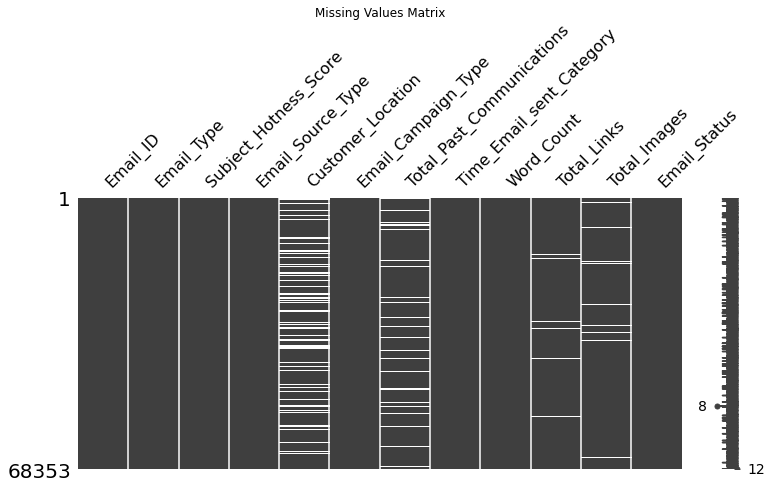

In [13]:
# Let's have a look at the missing values matrix
ax=mno.matrix(email_df, figsize = (12, 5))
plt.title("Missing Values Matrix")
plt.show()

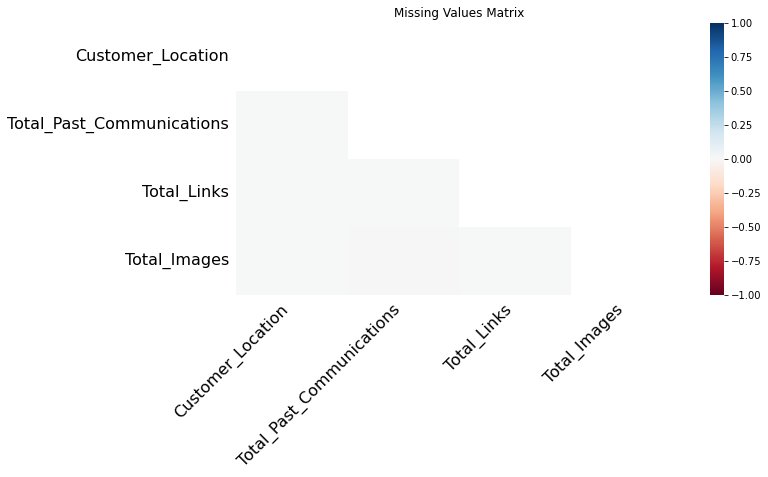

In [14]:
ax=mno.heatmap(email_df, figsize = (10, 5))
plt.title("Missing Values Matrix")
plt.show()

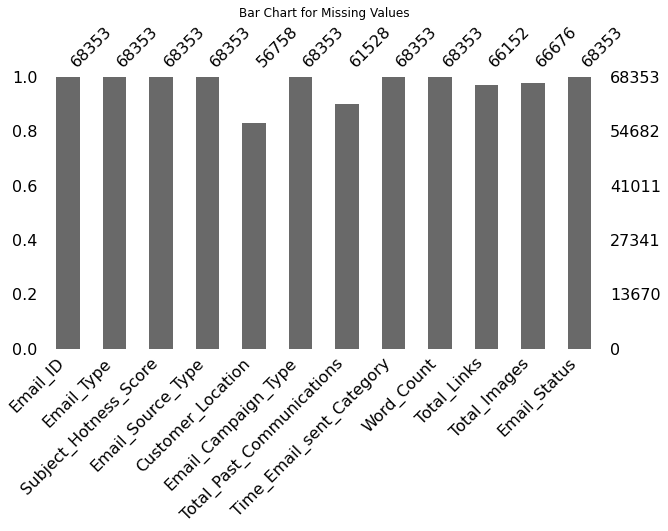

In [15]:
ax=mno.bar(email_df, figsize = (10, 5))
plt.title("Bar Chart for Missing Values")
plt.show()

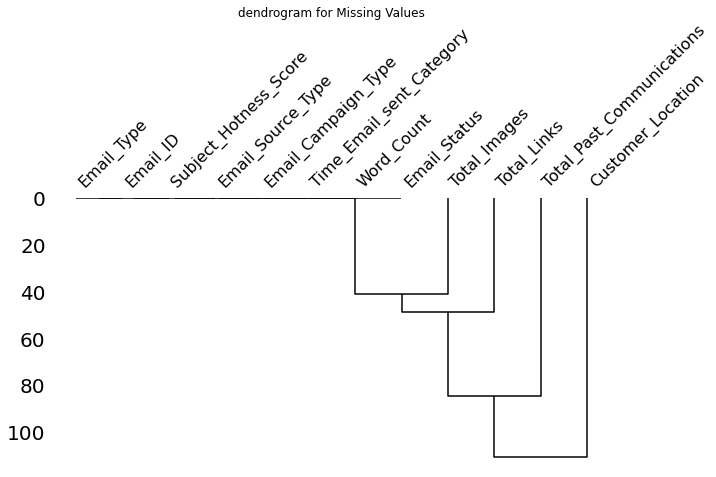

In [16]:
ax=mno.dendrogram(email_df, figsize = (10, 5))
plt.title("dendrogram for Missing Values")
plt.show()

In [17]:
## Lets go and see the percentage of missing values
email_df.isnull().mean()

Email_ID                     0.000000
Email_Type                   0.000000
Subject_Hotness_Score        0.000000
Email_Source_Type            0.000000
Customer_Location            0.169634
Email_Campaign_Type          0.000000
Total_Past_Communications    0.099849
Time_Email_sent_Category     0.000000
Word_Count                   0.000000
Total_Links                  0.032200
Total_Images                 0.024534
Email_Status                 0.000000
dtype: float64

In [18]:
# Check for duplicates
duplicate_df = email_df[email_df.duplicated()]
duplicate_df

,Email_ID,Email_Type,Subject_Hotness_Score,Email_Source_Type,Customer_Location,Email_Campaign_Type,Total_Past_Communications,Time_Email_sent_Category,Word_Count,Total_Links,Total_Images,Email_Status


# **Observations:**

* There are null values in four features namely, customer_location,total_past_communication, Total_links, Total_images.

* There are no duplicate values found!



In [19]:
# Let's see the descriptive statistics for numerical features
from google.colab import data_table                           # Importing the datatable extension of google colab.
email_df_describe=email_df[['Subject_Hotness_Score','Total_Past_Communications','Word_Count','Total_Links','Total_Images']].describe().round(2) # Selcting numerical columns only
email_df_describe

,Subject_Hotness_Score,Total_Past_Communications,Word_Count,Total_Links,Total_Images
count,68353.0,61528.00,68353.00,66152.00,66676.00
mean,1.1,28.93,699.93,10.43,3.55
std,1.0,12.54,271.72,6.38,5.60
min,0.0,0.00,40.00,1.00,0.00
25%,0.2,20.00,521.00,6.00,0.00
50%,0.8,28.00,694.00,9.00,0.00
75%,1.8,38.00,880.00,14.00,5.00
max,5.0,67.00,1316.00,49.00,45.00


# **Observations:**

* Subject Hotness Score is float value ranges from 0 to 5, where 0 is not hot, is very hot. The average subject hotness score for the given data set is around 1.105  Average total past communications is around 29. maximum total past communications are around 67 and the minimum is 0.

* Average word count is around 700 words. An email was sent with maximum words of around 1316 words. An email was sent with minimum words around 40 words.

*  Average total links sent is around 11 links, and the maximum total links sent is around 49 links, the minimum is 1 link.

*   Average total images sent through an email is around 4 images. The maximum total images sent are around 45 images.


In [22]:
email_df_cat_describe = email_df[['Email_Type','Email_Source_Type','Customer_Location','Email_Campaign_Type','Time_Email_sent_Category','Email_Status']].describe().round(2) # Selcting numerical columns only
email_df_cat_describe

,Email_Type,Email_Source_Type,Email_Campaign_Type,Time_Email_sent_Category,Email_Status
count,68353.00,68353.00,68353.00,68353.00,68353.00
mean,1.29,1.46,2.27,2.00,0.23
std,0.45,0.50,0.47,0.63,0.50
min,1.00,1.00,1.00,1.00,0.00
25%,1.00,1.00,2.00,2.00,0.00
50%,1.00,1.00,2.00,2.00,0.00
75%,2.00,2.00,3.00,2.00,0.00
max,2.00,2.00,3.00,3.00,2.00


# **Null Value Imputation:**

In [23]:
# selecting numeric features from data set
numeric_features = email_df[['Subject_Hotness_Score','Total_Past_Communications','Word_Count','Total_Links','Total_Images']].describe().columns

In [24]:
numeric_features

Index(['Subject_Hotness_Score', 'Total_Past_Communications', 'Word_Count',
       'Total_Links', 'Total_Images'],
      dtype='object')

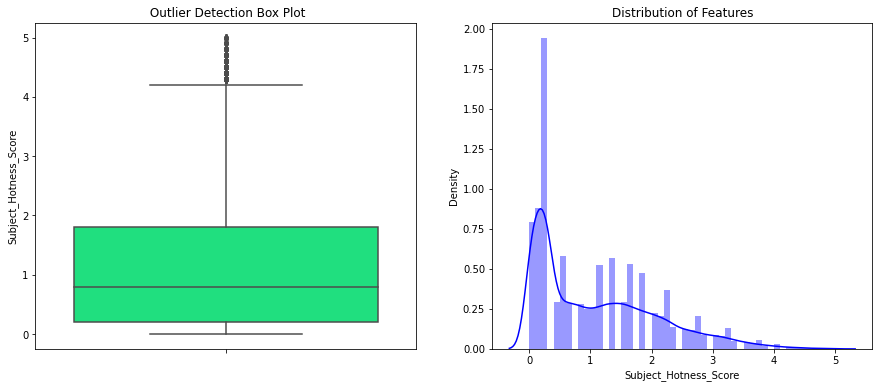

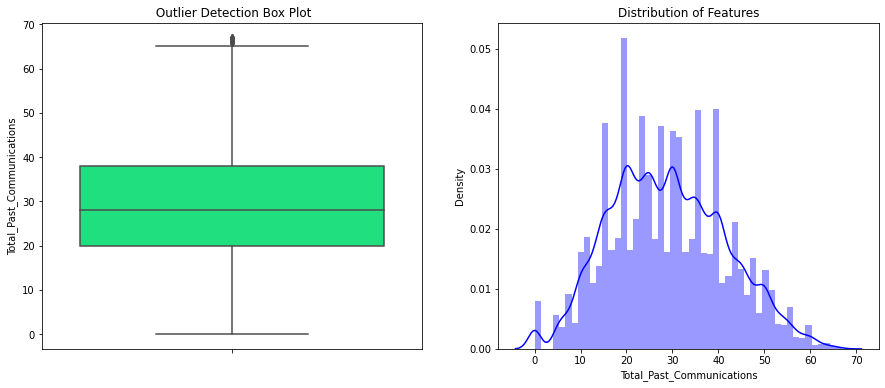

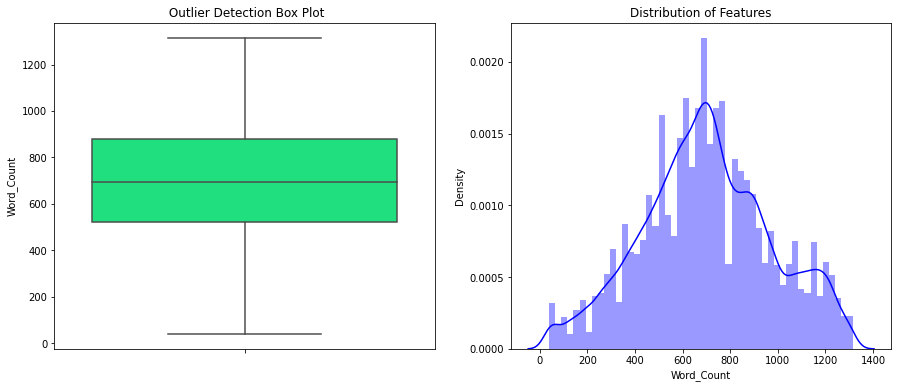

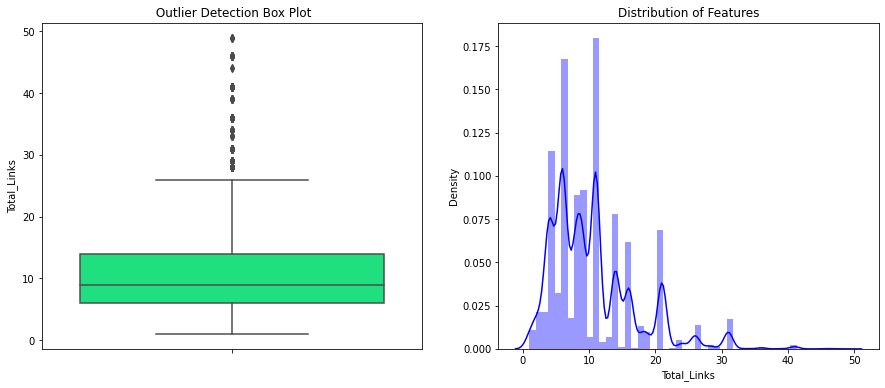

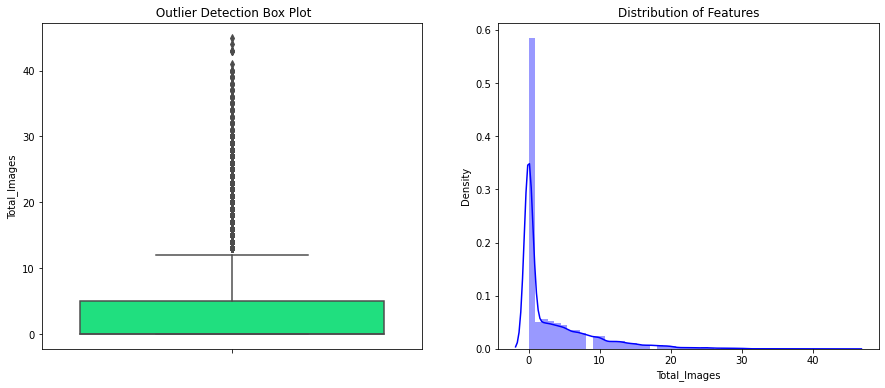

In [25]:
# Plotting the distribution of the numerical features
for var in numeric_features:
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    fig = sns.boxplot(y=email_df[var], color='#00FF7F')
    fig.set_title(' Outlier Detection Box Plot')
    fig.set_ylabel(var)
    
    plt.subplot(1, 2, 2)
    fig = sns.distplot(email_df[var].dropna(),color='blue')
    fig.set_title("Distribution of Features")
    fig.set_xlabel(var)
    plt.show()

# **Observations:** 


*   We observe that 2 features i.e. “ Word Count” and “Total_Past   Communications” follow a normal distribution.

*  The rest of the features were highly skewed to the left.

*   As we can observe the "Total_Past_Communications" is symmetricaly distributed so we can use mean value for imputing missing values for this feature.
*   Since the "Total_Links" is not normally distributed we will use Mode to impute missing value for this feature.

*   Since the "Total_Images" is not normally distributed and highly rightly skewed, we will use Mode to impute missing value for this feature.

*   There are outliers in Subject_Hotness_Score,Total_Links and Total_Images and the distribution of these features are right skewed in nature. There are also a few outliers in Total_Past_Communication which has a normal distribution .








In [26]:
# Imputting null values for total past communications feature with mean
print('Number of missing values before imputing is = ',email_df['Total_Past_Communications'].isnull().sum())
email_df['Total_Past_Communications'].fillna(email_df['Total_Past_Communications'].mean(),inplace=True)
print('Number of missing values after imputing is = ',email_df['Total_Past_Communications'].isnull().sum())

Number of missing values before imputing is =  6825
Number of missing values after imputing is =  0


In [30]:
#Filling missing values of Total_Links column
print('Number of missing values before imputing is = ',email_df['Total_Links'].isnull().sum())
email_df['Total_Links'].fillna(email_df['Total_Links'].mode()[0],inplace=True)
print('Number of missing values after imputing is = ', email_df['Total_Links'].isnull().sum())

Number of missing values before imputing is =  2201
Number of missing values after imputing is =  0


In [31]:
#Filling missing values of Total_Images column
print('Number of missing values before imputing is = ',email_df['Total_Images'].isnull().sum())
email_df['Total_Images'].fillna(email_df['Total_Images'].mode()[0],inplace=True)
print('Number of missing values after imputing is = ',email_df['Total_Images'].isnull().sum())
     

Number of missing values before imputing is =  1677
Number of missing values after imputing is =  0
